<a href="https://colab.research.google.com/github/rahiakela/deep-learning-research-and-practice/blob/main/inside-deep-learing/14-advanced-building-blocks/01_anti_aliasing_pooling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Anti-aliasing pooling

Anti-aliasing pooling improves on the pooling operation we have
been using, making it better for almost any CNN application. This pooling increases
accuracy by better handling small shifts in the content of an image.

As we know, pooling layers help us endow our models with translation
invariance: they produce the same or a similar answer when we shift the content of an image up/down or left/right.

They also increase the receptive field of postceding layers,
allowing each convolutional layer to view more of the input at once and gain additional context.

Despite their ubiquity, a subtle flaw has plagued CNNs for decades, and only
recently have we noticed it and devised a simple solution. The crux of the problem is that naive pooling loses more information than necessary and introduces noise as a
result.

We walk through an example that demonstrates how this loss of information
happens, and then we discuss the solution and develop a new pooling layer to fix it.

##Setup

In [ ]:
!wget https://github.com/EdwardRaff/Inside-Deep-Learning/raw/main/idlmam.py

In [ ]:
import os
import time
import requests

import pandas as pd
import numpy as np
import seaborn as sns

from PIL import Image
from io import BytesIO

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms
import math
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
from torchvision import transforms

from torch.utils.data import Dataset, DataLoader


from idlmam import set_seed

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
%matplotlib inline

In [ ]:
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
torch.backends.cudnn.deterministic=True
set_seed(42)

##Problem demonstration

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/9/9c/Zebra_in_Mikumi.JPG

In [ ]:
img_path = "Zebra_in_Mikumi.JPG"

img = Image.open(img_path)

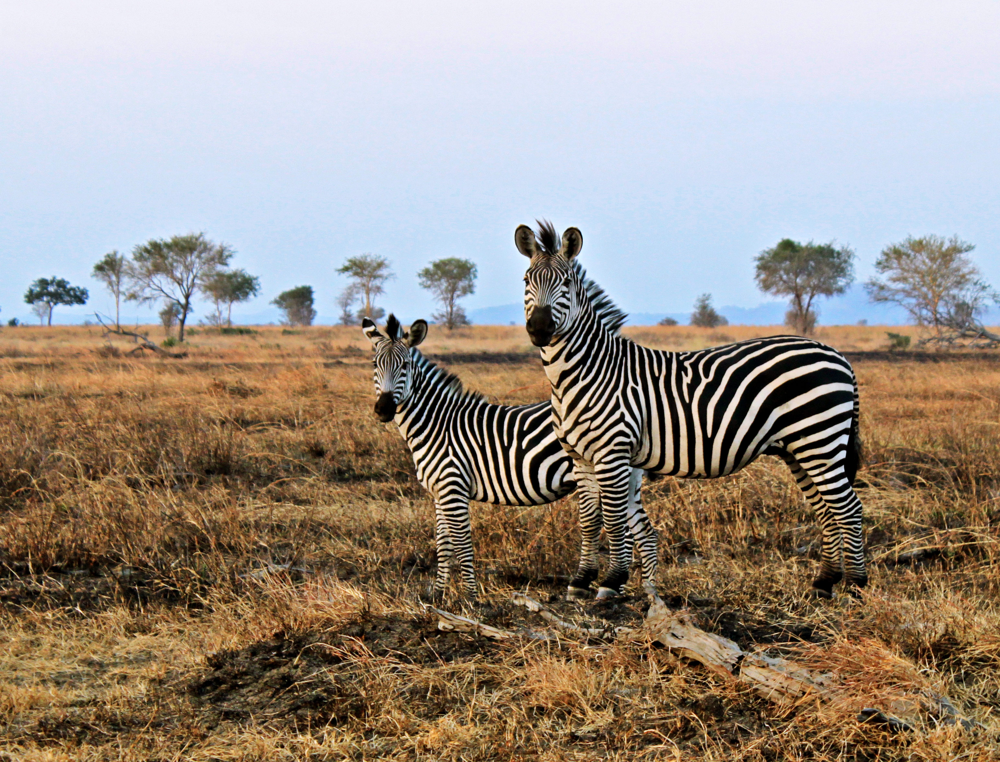

In [ ]:
img

In [ ]:
# let's resize the image to 1,000 pixels on the shortest dimension and crop out the center content
to_tensor = transforms.ToTensor()                       # transform converts PIL images to PyTorch tensors
resize = torchvision.transforms.Resize(1000)            # Resize smallest dimension to 1000 pixels
crop = torchvision.transforms.CenterCrop((1000, 1000))  # crop out the cente 1000x1000 pixels
img_tensor_big = to_tensor(crop(resize(img)))           # combine all three transformation steps to convert the image

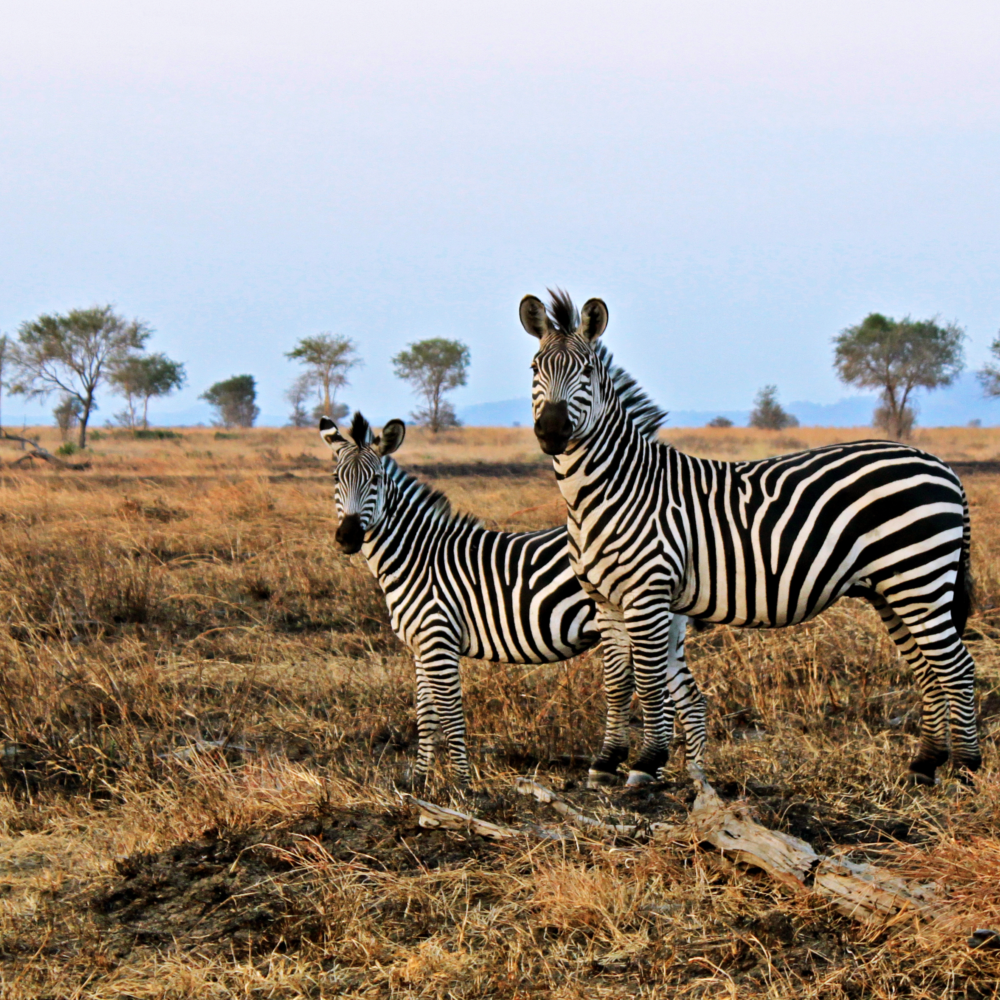

In [ ]:
to_img = transforms.ToPILImage()
to_img(img_tensor_big)

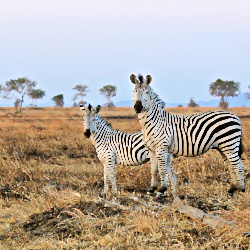

In [ ]:
# let's use max pooling to shrink the image by a factor of four
shrink_factor = 4  # How much pooling to perform
img_tensor_small = F.max_pool2d(img_tensor_big, (shrink_factor, shrink_factor))
to_img(img_tensor_small)

##Aliasing compromises translation invariance